<a href="https://colab.research.google.com/github/BassoTara/ImageRetrieval/blob/master/bow/retrieval_students_bow_giuliobassetti.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Retrieval using Bag of Visual Words

In this tutorial you will compare bag of words handcrafted features with a pre-trained neural network  as a feature extractor for image retrieval. In this first part we will employ feature quantization as a mean to speed up image retrieval on images with ~10,000 local image features  each.
##What is Image Retrieval?

Image retrieval is the task of, given a *query* image, re-ordering a set of images so that images which are most similar to the query have higher rank than less similar ones. A practical example would be, given a picture of the Tour Eiffel, and a folder containing thousands of images, find the three that depict the famous Paris monument.

Here is an example result of the system you are going to build today. The first picture is the query. Query is contained in the dataset therefore the first result is correctly the image itself. Following images are, ordered left-to-right by decreasing similarity.
![Retrieval Example](http://leon.micc.unifi.it/retrieval/boats.png)
![Retrieval Example](http://leon.micc.unifi.it/retrieval/tree.png)
![Retrieval Example](http://leon.micc.unifi.it/retrieval/rocks.png)



##Dataset
We are going to use the Holidays dataset created by INRIA. Holidays dataset is an annotated set of 1491 images with 500 query images.
http://lear.inrialpes.fr/~jegou/data.php
We will download precomputed [SIFT](https://www.cs.ubc.ca/~lowe/keypoints/) descriptors. SIFT has is a 128 dimensional histogram of orientations and it is extracted using scale and orientation invariant [operators](http://fourier.eng.hmc.edu/e161/lectures/gradient/node9.html).

##Example images from Holidays
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/101800_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/101800_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/105000_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/105000_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/108103_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/108103_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/111601_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/111601_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/114701_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/114701_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/117102_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/117102_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/121001_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/121001_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/125701_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/125701_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/127000_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/127000_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/131401_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/131401_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/112003_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/112003_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/115201_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/115201_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/118501_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/118501_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/123205_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/123205_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/125900_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/125900_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/129202_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/129202_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/131802_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/131802_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/102501_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/102501_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/107300_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/107300_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/110701_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/110701_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/112301_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/112301_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/115501_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/115501_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/120300_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/120300_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/125501_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/125501_sm.jpg" width=150></a>




In [0]:
#install cupy in case you have a GPU runtime this can speed up numpy computation
from IPython.utils import io
with io.capture_output():
  !apt -y -q install cuda-libraries-dev-9-2
  !pip install -q cupy-cuda92 chainer
import cupy as cp


In [0]:
#import dependencies
import glob
import numpy as np
import ntpath
from IPython.utils import io
import matplotlib.pyplot as plt
from google.colab import drive
#drive.mount('/content/gdrive') #mount your google drive to export images, features, data, etc...

In [0]:
#function to show neat progress bars
from IPython.display import HTML, display
import time

def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))



##Let's download the Features!
We will simply run wget inside the notebook. Features can be extracted again using  Krystian Mikolajczyk  [implementation](http://pascal.inrialpes.fr/data/holidays/compute_descriptors).
Any other feature extractor can be used, but in such case dictionary must recomputed using feature extracted with the same procedure (possibly same code...) to make sure dictionary centroids and extracted features are consistent (normalization, quantisation, clipping etc etc).

Some examples of feature extraction libraries:

1.   VLFEAT - http://www.vlfeat.org/
2.   OpenCV - https://docs.opencv.org/3.4/da/df5/tutorial_py_sift_intro.html
3.   SIFTGPU - https://github.com/pitzer/SiftGPU











In [4]:
#get the SIFT features via ftp

!wget ftp://ftp.inrialpes.fr/pub/lear/douze/data/siftgeo.tar.gz 


--2018-11-11 16:00:06--  ftp://ftp.inrialpes.fr/pub/lear/douze/data/siftgeo.tar.gz
           => ‘siftgeo.tar.gz’
Resolving ftp.inrialpes.fr (ftp.inrialpes.fr)... 194.199.18.221
Connecting to ftp.inrialpes.fr (ftp.inrialpes.fr)|194.199.18.221|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /pub/lear/douze/data ... done.
==> SIZE siftgeo.tar.gz ... 551669546
==> PASV ... done.    ==> RETR siftgeo.tar.gz ... done.
Length: 551669546 (526M) (unauthoritative)

siftgeo.tar.gz      100%[===================>] 526.11M  8.88MB/s    in 64s     

2018-11-11 16:01:11 (8.27 MB/s) - ‘siftgeo.tar.gz’ saved [551669546]



In [0]:
with io.capture_output() as extracted_files: #this will avoid cluttering with the output. Remove this line to see command line output
  !tar xzvf siftgeo.tar.gz


##Let's download the codebooks!

We will simply run wget inside the notebook. This archive contains visual dictionaries of different sizes (100, 200, 500, 1K, 2K, 5K, 10K, 20K, 50K, 100K and 200K visual words, 144MB) learned on Flickr60K.

In [6]:
!wget ftp://ftp.inrialpes.fr/pub/lear/douze/data/clust.tar.gz#get the dictionaries
with io.capture_output() as extracted_files: #this will avoid cluttering with the output. Remove this line to see command line output
  !tar xzvf clust.tar.gz


--2018-11-11 16:01:26--  ftp://ftp.inrialpes.fr/pub/lear/douze/data/clust.tar.gz
           => ‘clust.tar.gz’
Resolving ftp.inrialpes.fr (ftp.inrialpes.fr)... 194.199.18.221
Connecting to ftp.inrialpes.fr (ftp.inrialpes.fr)|194.199.18.221|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /pub/lear/douze/data ... done.
==> SIZE clust.tar.gz ... 150388107
==> PASV ... done.    ==> RETR clust.tar.gz ... done.
Length: 150388107 (143M) (unauthoritative)

clust.tar.gz        100%[===================>] 143.42M  5.80MB/s    in 26s     

2018-11-11 16:01:54 (5.42 MB/s) - ‘clust.tar.gz’ saved [150388107]

--2018-11-11 16:01:54--  http://the/
Resolving the (the)... failed: Name or service not known.
wget: unable to resolve host address ‘the’
--2018-11-11 16:01:54--  http://dictionaries/
Resolving dictionaries (dictionaries)... failed: Name or service not known.
wget: unable to resolve host address ‘dictionaries’
FINI

##Import binary features in numpy arrays
Here we are going to use a nice feature of NumPy. We will define a datatype


```
np.dtype([('xy', np.float32, (2,)),('meta', np.float32, (7,)),('desc_dim', np.int32) ,('desc', np.uint8, (128,))])
```

.. and read all descriptors using 



```
np.fromfile(opened_file,dtype=sift_dtype)
```




In [7]:
files = glob.glob('siftgeo/*.siftgeo')
imnames = [ntpath.basename(f).split('.')[0] for f in files]
len(files)

1491

In [8]:
sift_dtype = np.dtype([('xy', np.float32, (2,)),('meta', np.float32, (7,)),('desc_dim', np.int32) ,('desc', np.uint8, (128,))])
img_descs = {}
out = display(progress(0, len(files)), display_id=True)
ii=0
for f in files:
  with open(f,'rb') as d:
    all_desc=np.fromfile(d,dtype=sift_dtype)
  imname = ntpath.basename(f).split('.')[0]
  img_descs[imname] = cp.array([d['desc']/np.linalg.norm(d['desc']) for d in all_desc])
  ii+=1
  out.update(progress(ii, len(files)))


Dataset has been parsed we now have stored all image names (withouth path and extension) i


```
imnames
```
and all sift descriptors are indexed via imnames in the dictionary


```
img_descs
```





In [9]:
print('Image %s.jpg descriptor array: %d,%d' % (imnames[10], img_descs[imnames[10]].shape[0], img_descs[imnames[10]].shape[1]))

Image 146302.jpg descriptor array: 893,128


In [0]:
#same as for features, we define a dtype and read into memory a dictionary of a K words 
centroid_dtype = np.dtype([('desc_dim', np.int32) ,('desc', np.float32, (128,))])
ii=0
f = 'clust/clust_flickr60_k2000.fvecs' #200 words dictionary
with open(f,'rb') as d:
  all_centroids=np.fromfile(d,dtype=centroid_dtype)
centroids = cp.array([d['desc']/np.linalg.norm(d['desc']) for d in all_centroids])

dict_size = centroids.shape[0]

##Exercise 1
Compute a single BOW and show what it looks like. Remember the steps:


Consider all SIFT descriptors of an image, for example these are for the first image:


```
img_descs[imnames[0]]
```


1.   For each SIFT feature descritpor *d*  find its nearest cluster and the respective id


```
cluster_ids
```


2.   Create a np.array of shape (1,dict_size) containing counts of cluster_ids

Your bag of words should roughly look like the random generated vector below

CAVEAT: Be careful of images that may not have SIFT extracted. For safety use a vector of zeros.


#Compute all Bag-of-Words!

##Exercise 2
Compute the final np.array holding all bag of words, one per image:


```
bow_array
```
having a shape (1491, dict_size)

##Questions


1.   Is it possible to map a feature on multiple centroids? When do you think this is important?
2.   How can we weight local features in the histogram?





In [11]:
cuda = True
out = display(progress(0, len(files)), display_id=True)
ii=0
bow_array=cp.zeros((len(imnames), dict_size))
normalize_bow=False#
K=5#

for index, imname in enumerate(imnames):
  
  #SOLUTION
  i_d = img_descs[imname] # get descriptors of first image
  if i_d.shape[0]:
    M = 1 - cp.matmul(i_d, centroids.transpose()) #element (i,j) is distance between descriptor i and cluster j
    cluster_indices = cp.argmin(M, axis=1) #get an array where element i is the column index of M --> for each descriptor gets the index of nearest cluster
    bow_array[index] = cp.histogram(cluster_indices, bins = cp.arange(dict_size + 1))[0]

  ii+=1
  out.update(progress(ii, len(files)))

In [0]:
bow_array = cp.asnumpy(bow_array)

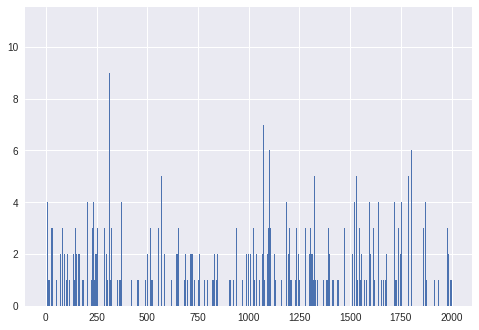

In [13]:
plt.bar(range(len(bow_array[0])), bow_array[0]) 
plt.show()

In [14]:
print(bow_array.shape)

(1491, 2000)


##Data preparation
Now we will create a separate array containing only query bows. These are the images whose names ends by "00" or whose id divides by 100.

In [0]:
# get the indices of the query images (the subset of images that end in "00")
query_imids = [i for i, name in enumerate(imnames) if name[-2:] == "00"]

# corresponding descriptors
query_bows = bow_array[query_imids]

In [16]:
query_bows.shape

(500, 2000)

# Retrieve!

##Exercise 3

1.   compute all distances between queries and data
2.   create a matrix containing for each row indices, sorted by decreasing similarity with the query

store distances in a variable:


```
distances
```
 and image ids, ranked in the variable:
 
 
```
indices
```

indices is an integer array that should have shape: (500,1491) 







In [0]:
from sklearn.neighbors import NearestNeighbors#

nbrs = NearestNeighbors(n_neighbors=len(imnames), metric='cosine').fit(bow_array)
distances, indices = nbrs.kneighbors(query_bows)


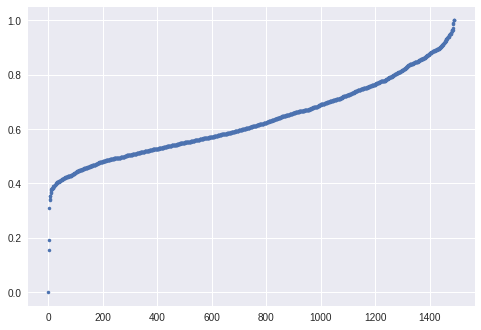

In [18]:
plt.plot(distances[0],'.')
plt.show()

#How did we do?
In retrieval we use mean Average Precision (mAP for short). It is the average precision value computed over a range of recall values. This can be also seen as the area below the Precision-Recal Plot

![Average Precision](http://scikit-learn.org/stable/_images/sphx_glr_plot_precision_recall_001.png)

Average precision evaluate how good a ranking is. This means that a high mAP corresponds to a ranking with the few relevant images in the first positions.

##Questions

1.   What happens when you increase/decrease the dictionary size?
2.   What metrics can you employ for computing the distances? Try a few of them
3.   What normalization strategy can be used on a BoW?

In [0]:
#this function creates a perfect ranking :)
def make_perfect_holidays_result(imnames, q_ids):
  perfect_idx =[]
  for qimno in q_ids:
      qname = imnames[qimno]
      positive_results = set([i for i, name in enumerate(imnames) if name != qname and name[:4] == qname[:4]])
      ok=[qimno]+[i for i in  positive_results]
      others = [i for i in range(1491) if i not in positive_results and i != qimno]
      perfect_idx.append(ok+others)
  return np.array(perfect_idx)


In [20]:
def mAP(q_ids, idx):
  aps = []
  for qimno, qres in zip(q_ids, idx):
      qname = imnames[qimno]
      # collect the positive results in the dataset
      # the positives have the same prefix as the query image
      positive_results = set([i for i, name in enumerate(imnames)
                              if name != qname and name[:4] == qname[:4]])
      #
      # ranks of positives. We skip the result #0, assumed to be the query image
      ranks = [i for i, res in enumerate(qres[1:]) if res in positive_results]
      #
      # accumulate trapezoids with this basis
      recall_step = 1.0 / len(positive_results)
      ap = 0
      for ntp,rank in enumerate(ranks):
          # ntp = nb of true positives so far
          # rank = nb of retrieved items so far
          # y-size on left side of trapezoid:
          precision_0 = ntp/float(rank) if rank > 0 else 1.0
          # y-size on right side of trapezoid:
          precision_1 = (ntp + 1) / float(rank + 1)
          ap += (precision_1 + precision_0) * recall_step / 2.0
      #print('query %s, AP = %.3f' % (qname, ap))
      aps.append(ap)
  return np.mean(aps)
print('mean AP = %.3f'%mAP(query_imids, indices))
perfect_result=make_perfect_holidays_result(imnames, query_imids)
print('Perfect mean AP = %.3f'%mAP(query_imids,perfect_result))

mean AP = 0.396
Perfect mean AP = 1.000


In [21]:
#get a dataset of resized images to display results
!wget http://leon.micc.unifi.it/holidays_small.tar.gz
with io.capture_output() as extracted_files: #this will avoid cluttering with the output. Remove this line to see command line output
  !tar xzvf holidays_small.tar.gz 

--2018-11-11 16:03:58--  http://leon.micc.unifi.it/holidays_small.tar.gz
Resolving leon.micc.unifi.it (leon.micc.unifi.it)... 150.217.35.168
Connecting to leon.micc.unifi.it (leon.micc.unifi.it)|150.217.35.168|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 207187552 (198M) [application/x-gzip]
Saving to: ‘holidays_small.tar.gz’

holidays_small.tar. 100%[===================>] 197.59M  11.2MB/s    in 18s     

2018-11-11 16:04:17 (10.7 MB/s) - ‘holidays_small.tar.gz’ saved [207187552/207187552]



In [0]:
import PIL

import math
def montage(imfiles, thumb_size=(100,100), ok=None, shape=None ):
  #this function will create an image with thumbnailed version of imfiles.
  #optionally the user can provide an ok list such that len(ok)==len(imfiles) to differentiate correct from wrong results
  #optionally the user can provide a shape function which shapes the montage otherwise a square image is created.  
  images = [PIL.Image.open(imname).resize(thumb_size,PIL.Image.BILINEAR) for imname in imfiles]
  #create a big image to contain all images
  if shape is None:
    n = int(math.sqrt(len(imfiles)))
    m=n
  else:
    n=shape[0]
    m=shape[1]
  new_im = PIL.Image.new('RGB', (m*thumb_size[0],n*thumb_size[0]))
  k=0
  for i in range(0,n*thumb_size[0], thumb_size[0]):
    for j in range(0,m*thumb_size[0], thumb_size[0]):
      region=(j,i)
      if ok is not None:
        if ok[k]:
          color = (0,255,0)
        else:
          color  = (255,0,0)
        if k > 0:
          imar = np.array(images[k],dtype=np.uint8)
          imar[0:5,:,:] = color;
          imar[:,0:5,:] = color;
          imar[-5:,:,:] = color;
          imar[:,-5:,:] = color;
          images[k]=PIL.Image.fromarray(imar)
      new_im.paste(images[k] ,box=region)
      k+=1
  return new_im

#Qualitative Result Inspection
It is often interesting to observe the behavior of our algorithms qualitatively. We can often learn a lot about the features we are using and how their invariance and robustness to transformations can help retrieval.

##Exercise 4
Considering that we are using SIFT quantized with Bag of Words. Use the tool provided for visualization and pick few examples that explain clearly what are the invariances of the local SIFT feature descriptor/detector.

In [0]:
#here we show the first 10 queries and their 10 closest neighbours retrieved
#gree border means ok, red wrong :)
def show_result(display_idx, nqueries=10, nresults=10,ts=(100,100)):

  from IPython.display import display
  if nqueries is not None :
    nrow = nqueries   # number of query images to show
  
  if nresults is not None :
    nres = 10  # number of results per query

  for qno in range(nrow):
      imfiles=[]
      oks = [True]
      # show query image with white outline
      qimno = query_imids[qno]
      imfiles.append('holidays_small/'+imnames[qimno]+'.jpg')
      for qres in display_idx[qno, :nres]:
          # use image name to determine if it is a TP or FP result
          oks.append(imnames[qres][:4] == imnames[qimno][:4])
          imfiles.append('holidays_small/'+imnames[qres]+'.jpg')
      print (qno, (imfiles))
      display(montage(imfiles,thumb_size=ts,ok=oks, shape=(1,nres)))



0 ['holidays_small/133800.jpg', 'holidays_small/133800.jpg', 'holidays_small/133801.jpg', 'holidays_small/133802.jpg', 'holidays_small/134000.jpg', 'holidays_small/138401.jpg', 'holidays_small/133901.jpg', 'holidays_small/133900.jpg', 'holidays_small/110101.jpg', 'holidays_small/122502.jpg', 'holidays_small/102300.jpg']


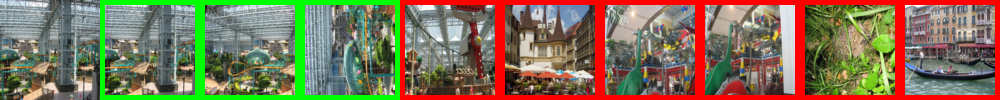

1 ['holidays_small/139600.jpg', 'holidays_small/139600.jpg', 'holidays_small/139603.jpg', 'holidays_small/133800.jpg', 'holidays_small/134000.jpg', 'holidays_small/133901.jpg', 'holidays_small/138401.jpg', 'holidays_small/133900.jpg', 'holidays_small/139602.jpg', 'holidays_small/109700.jpg', 'holidays_small/100601.jpg']


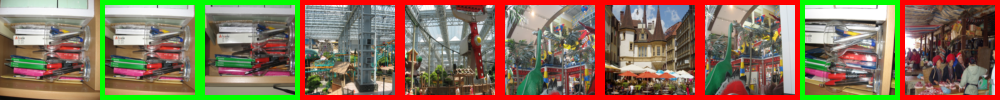

2 ['holidays_small/133600.jpg', 'holidays_small/133600.jpg', 'holidays_small/103401.jpg', 'holidays_small/103400.jpg', 'holidays_small/133602.jpg', 'holidays_small/114601.jpg', 'holidays_small/114901.jpg', 'holidays_small/118003.jpg', 'holidays_small/137101.jpg', 'holidays_small/114900.jpg', 'holidays_small/133401.jpg']


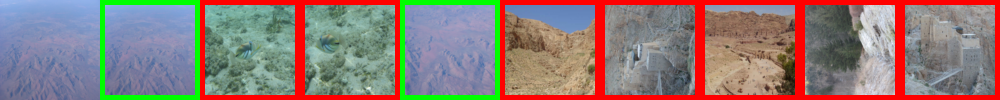

3 ['holidays_small/120600.jpg', 'holidays_small/120600.jpg', 'holidays_small/141201.jpg', 'holidays_small/141202.jpg', 'holidays_small/136300.jpg', 'holidays_small/122602.jpg', 'holidays_small/117700.jpg', 'holidays_small/121401.jpg', 'holidays_small/122600.jpg', 'holidays_small/115500.jpg', 'holidays_small/123301.jpg']


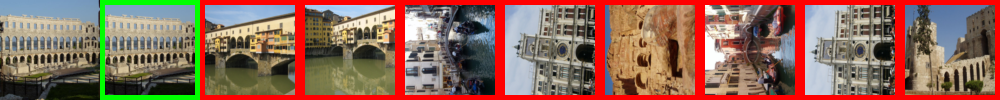

4 ['holidays_small/103700.jpg', 'holidays_small/103700.jpg', 'holidays_small/104005.jpg', 'holidays_small/104002.jpg', 'holidays_small/104000.jpg', 'holidays_small/104006.jpg', 'holidays_small/104001.jpg', 'holidays_small/109401.jpg', 'holidays_small/106800.jpg', 'holidays_small/103702.jpg', 'holidays_small/103701.jpg']


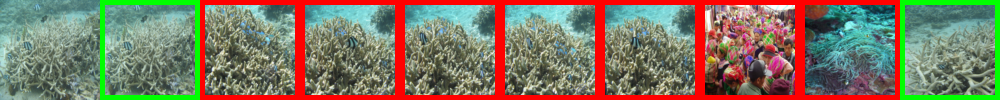

5 ['holidays_small/145800.jpg', 'holidays_small/145800.jpg', 'holidays_small/145700.jpg', 'holidays_small/136103.jpg', 'holidays_small/145701.jpg', 'holidays_small/147603.jpg', 'holidays_small/146201.jpg', 'holidays_small/146203.jpg', 'holidays_small/146207.jpg', 'holidays_small/145801.jpg', 'holidays_small/147200.jpg']


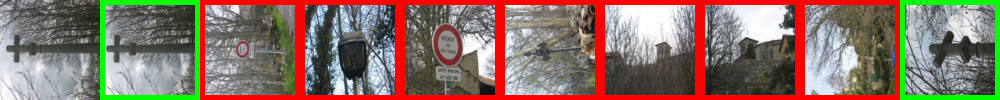

6 ['holidays_small/147300.jpg', 'holidays_small/147300.jpg', 'holidays_small/136707.jpg', 'holidays_small/114600.jpg', 'holidays_small/136901.jpg', 'holidays_small/104600.jpg', 'holidays_small/136700.jpg', 'holidays_small/117802.jpg', 'holidays_small/146500.jpg', 'holidays_small/114601.jpg', 'holidays_small/147301.jpg']


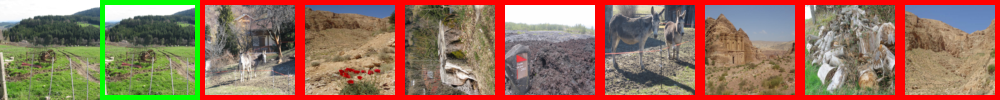

7 ['holidays_small/129600.jpg', 'holidays_small/129600.jpg', 'holidays_small/140201.jpg', 'holidays_small/145402.jpg', 'holidays_small/134401.jpg', 'holidays_small/147402.jpg', 'holidays_small/134403.jpg', 'holidays_small/146500.jpg', 'holidays_small/103102.jpg', 'holidays_small/103902.jpg', 'holidays_small/136803.jpg']


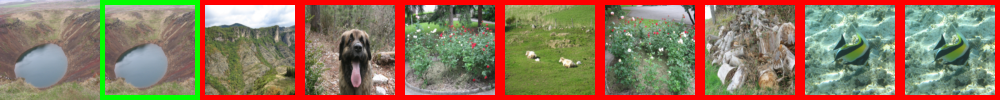

8 ['holidays_small/101600.jpg', 'holidays_small/101600.jpg', 'holidays_small/101601.jpg', 'holidays_small/115201.jpg', 'holidays_small/115200.jpg', 'holidays_small/117700.jpg', 'holidays_small/117701.jpg', 'holidays_small/117801.jpg', 'holidays_small/116300.jpg', 'holidays_small/146701.jpg', 'holidays_small/116002.jpg']


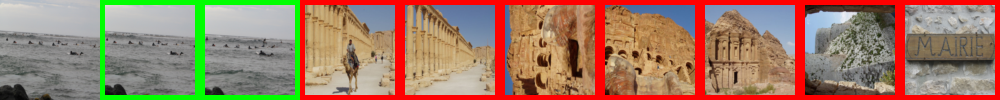

9 ['holidays_small/133200.jpg', 'holidays_small/133200.jpg', 'holidays_small/136802.jpg', 'holidays_small/117601.jpg', 'holidays_small/100400.jpg', 'holidays_small/135600.jpg', 'holidays_small/135601.jpg', 'holidays_small/136801.jpg', 'holidays_small/136901.jpg', 'holidays_small/136800.jpg', 'holidays_small/136707.jpg']


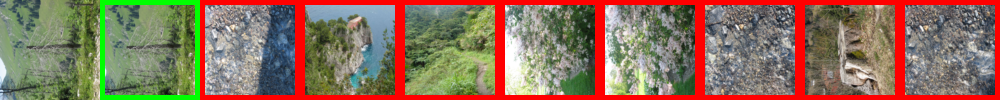

In [24]:
show_result(indices)



0 ['holidays_small/133800.jpg', 'holidays_small/133800.jpg', 'holidays_small/133802.jpg', 'holidays_small/133801.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg', 'holidays_small/147603.jpg']


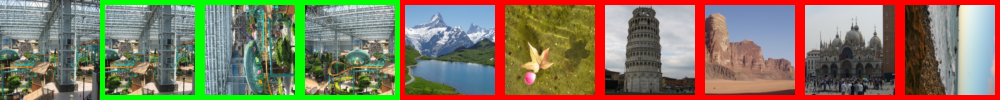

1 ['holidays_small/139600.jpg', 'holidays_small/139600.jpg', 'holidays_small/139603.jpg', 'holidays_small/139601.jpg', 'holidays_small/139602.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg']


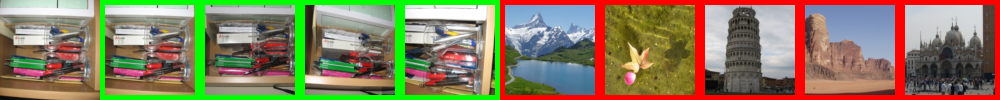

2 ['holidays_small/133600.jpg', 'holidays_small/133600.jpg', 'holidays_small/133601.jpg', 'holidays_small/133602.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg', 'holidays_small/133800.jpg']


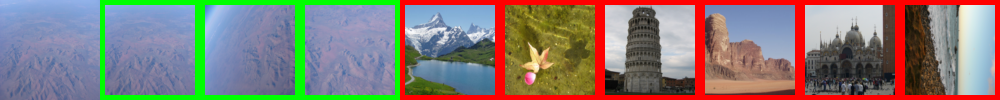

3 ['holidays_small/120600.jpg', 'holidays_small/120600.jpg', 'holidays_small/120601.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg', 'holidays_small/133800.jpg', 'holidays_small/147603.jpg']


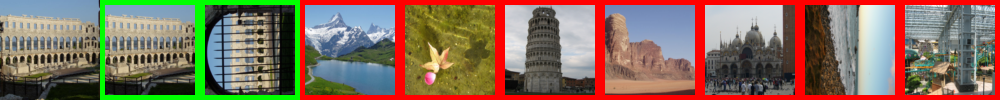

4 ['holidays_small/103700.jpg', 'holidays_small/103700.jpg', 'holidays_small/103701.jpg', 'holidays_small/103702.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg', 'holidays_small/133800.jpg']


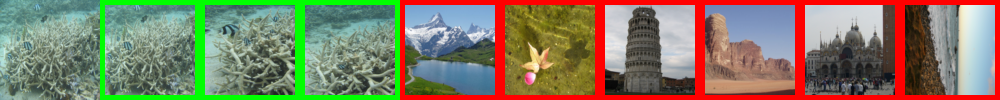

5 ['holidays_small/145800.jpg', 'holidays_small/145800.jpg', 'holidays_small/145802.jpg', 'holidays_small/145801.jpg', 'holidays_small/145803.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg']


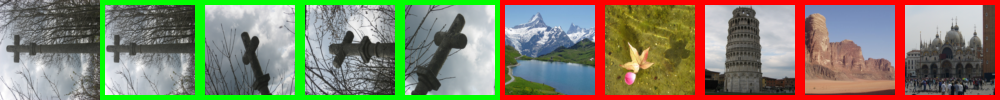

6 ['holidays_small/147300.jpg', 'holidays_small/147300.jpg', 'holidays_small/147302.jpg', 'holidays_small/147303.jpg', 'holidays_small/147304.jpg', 'holidays_small/147301.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg']


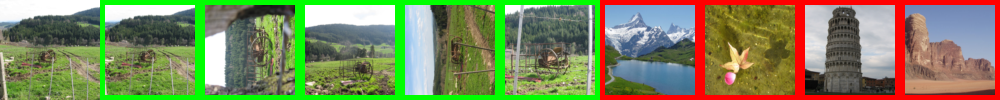

7 ['holidays_small/129600.jpg', 'holidays_small/129600.jpg', 'holidays_small/129602.jpg', 'holidays_small/129601.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg', 'holidays_small/133800.jpg']


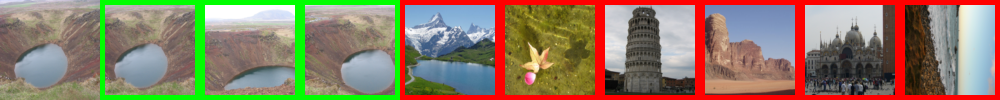

8 ['holidays_small/101600.jpg', 'holidays_small/101600.jpg', 'holidays_small/101601.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg', 'holidays_small/133800.jpg', 'holidays_small/147603.jpg']


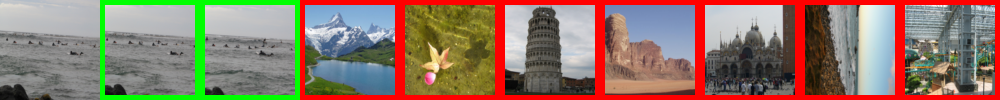

9 ['holidays_small/133200.jpg', 'holidays_small/133200.jpg', 'holidays_small/133201.jpg', 'holidays_small/133202.jpg', 'holidays_small/112406.jpg', 'holidays_small/140902.jpg', 'holidays_small/141303.jpg', 'holidays_small/118501.jpg', 'holidays_small/122704.jpg', 'holidays_small/100801.jpg', 'holidays_small/133800.jpg']


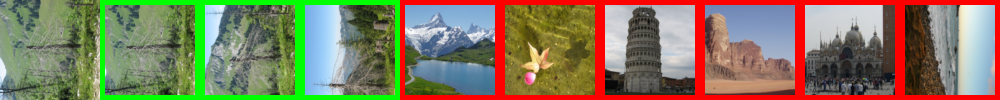

In [25]:
show_result(perfect_result)

5 ['holidays_small/145800.jpg', 'holidays_small/145800.jpg', 'holidays_small/145700.jpg', 'holidays_small/136103.jpg', 'holidays_small/145701.jpg', 'holidays_small/147603.jpg', 'holidays_small/146201.jpg', 'holidays_small/146203.jpg', 'holidays_small/146207.jpg', 'holidays_small/145801.jpg', 'holidays_small/147200.jpg']


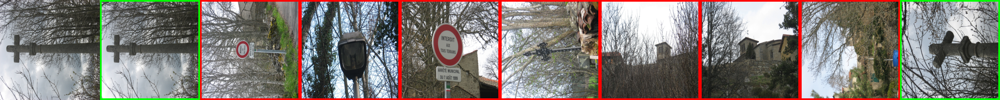

224 ['holidays_small/148400.jpg', 'holidays_small/148400.jpg', 'holidays_small/147201.jpg', 'holidays_small/136201.jpg', 'holidays_small/147202.jpg', 'holidays_small/148401.jpg', 'holidays_small/113801.jpg', 'holidays_small/136203.jpg', 'holidays_small/106702.jpg', 'holidays_small/126501.jpg', 'holidays_small/136202.jpg']


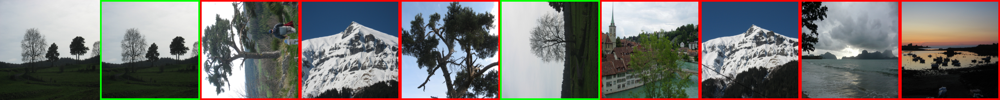

347 ['holidays_small/107200.jpg', 'holidays_small/107200.jpg', 'holidays_small/107201.jpg', 'holidays_small/130301.jpg', 'holidays_small/140601.jpg', 'holidays_small/104101.jpg', 'holidays_small/134401.jpg', 'holidays_small/136803.jpg', 'holidays_small/103800.jpg', 'holidays_small/136805.jpg', 'holidays_small/104100.jpg']


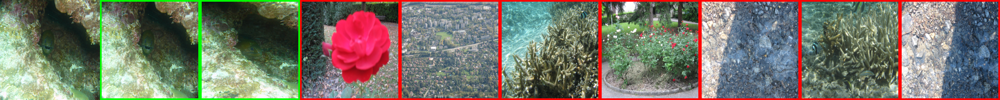

446 ['holidays_small/141600.jpg', 'holidays_small/141600.jpg', 'holidays_small/141601.jpg', 'holidays_small/122502.jpg', 'holidays_small/143001.jpg', 'holidays_small/133802.jpg', 'holidays_small/109901.jpg', 'holidays_small/133801.jpg', 'holidays_small/112700.jpg', 'holidays_small/112701.jpg', 'holidays_small/133800.jpg']


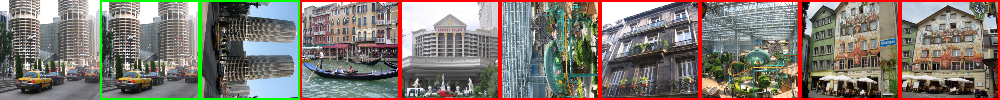

In [26]:
#here we show the first 25 queries and their 15 closest neighbours retrieved
#gree border means ok, red wrong :)
display_idx = indices
#display_idx = perfect_result # displays output of perfect system 

from IPython.display import display
nrow = 500   # number of query images to show
nres = 10  # number of results per query

#for qno in range(nrow):
for qno in [5, 224,347,446]:
    imfiles=[]
    oks = [True]
    # show query image with white outline
    qimno = query_imids[qno]
    imfiles.append('holidays_small/'+imnames[qimno]+'.jpg')
    for qres in display_idx[qno, :nres]:
        # use image name to determine if it is a TP or FP result
        oks.append(imnames[qres][:4] == imnames[qimno][:4])
        imfiles.append('holidays_small/'+imnames[qres]+'.jpg')
    print (qno, (imfiles))
    display(montage(imfiles,thumb_size=(300,300),ok=oks, shape=(1,nres)))

#Create your own dictionary

In case we use a different feature extractor or we want to try a different local feature normalization it is mandatory to re-learn the codebook.
We are going to use the [k-means](https://en.wikipedia.org/wiki/K-means_clustering) algorithm.

First we need a sample of data to cluster. 
##Exercise 5
Cycle through image descriptors and sample a random subset of descriptors for each image.
You should end up with a variable


```
all_descs
```
with all_descs.shape=(NDESCS, 128)

CAVEAT: transform your variable as floating point (all_descs.astype(np.float32))

##Clustering
Once you are done sampling your features use a sklearn implementation of k-means. MiniBatchKmeans is suggested for speed.

Your centroid should have shape= (dict_size, 128)

In [27]:
all_descs = []

for i, imname in enumerate(imnames):
  i_d = img_descs[imname]
  if(i_d.shape[0] >= 20):
    i_d_r = i_d[np.random.randint(i_d.shape[0], size=20), :]
  else:
    i_d_r = i_d
  for row in i_d_r:
    all_descs.append(row)
    
all_descs = np.array(all_descs).astype(np.float32)
print(all_descs.shape)

(29713, 128)


In [28]:
from sklearn.cluster import MiniBatchKMeans
kmeans = MiniBatchKMeans(n_clusters = dict_size)
kmeans.fit(all_descs)
print(kmeans.cluster_centers_.shape)

centroids = cp.array([d/np.linalg.norm(d) for d in kmeans.cluster_centers_])

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/k_means_.py:1418: RuntimeWarning: init_size=300 should be larger than k=2000. Setting it to 3*k
  init_size=init_size)


(2000, 128)


In [29]:
print(centroids.shape)
print(centroids)

(2000, 128)
[[0.1042555  0.02714431 0.00449338 ... 0.11170407 0.17306957 0.04411071]
 [0.0295043  0.00196695 0.00786781 ... 0.19079448 0.15538932 0.04327298]
 [0.0168708  0.04019042 0.0148869  ... 0.01141163 0.         0.01141163]
 ...
 [0.0892436  0.16180454 0.05080336 ... 0.02075624 0.00934031 0.03732828]
 [0.06997483 0.03121863 0.0375516  ... 0.04750498 0.18742853 0.0865957 ]
 [0.04917413 0.04917413 0.00590089 ... 0.01376875 0.10228217 0.07671163]]


#Exercise 6
Go back to previous cells
SUGGESTION: create new cells from here on with quantization and retrieval code, this will minimize the chance you are running code with variables wrongly initialized

Try again with your own codebook. 
1. Are the results the same? 
2. Try different codebook sizes.

In [30]:
cuda = True
out = display(progress(0, len(files)), display_id=True)
ii=0
bow_array=cp.zeros((len(imnames), dict_size))
normalize_bow=False#
K=5#

for index, imname in enumerate(imnames):
  
  #SOLUTION
  i_d = img_descs[imname] # get descriptors of first image
  if i_d.shape[0]:
    M = 1 - cp.matmul(i_d, centroids.transpose()) #element (i,j) is distance between descriptor i and cluster j
    cluster_indices = cp.argmin(M, axis=1) #get an array where element i is the column index of M --> for each descriptor gets the index of nearest cluster
    bow_array[index] = cp.histogram(cluster_indices, bins = cp.arange(dict_size + 1))[0]

  ii+=1
  out.update(progress(ii, len(files)))
  
bow_array = cp.asnumpy(bow_array)


# get the indices of the query images (the subset of images that end in "00")
query_imids = [i for i, name in enumerate(imnames) if name[-2:] == "00"]

# corresponding descriptors
query_bows = bow_array[query_imids]

from sklearn.neighbors import NearestNeighbors#

nbrs = NearestNeighbors(n_neighbors=len(imnames), metric='cosine').fit(bow_array)
distances, indices = nbrs.kneighbors(query_bows)

#this function creates a perfect ranking :)
def make_perfect_holidays_result(imnames, q_ids):
  perfect_idx =[]
  for qimno in q_ids:
      qname = imnames[qimno]
      positive_results = set([i for i, name in enumerate(imnames) if name != qname and name[:4] == qname[:4]])
      ok=[qimno]+[i for i in  positive_results]
      others = [i for i in range(1491) if i not in positive_results and i != qimno]
      perfect_idx.append(ok+others)
  return np.array(perfect_idx)

def mAP(q_ids, idx):
  aps = []
  for qimno, qres in zip(q_ids, idx):
      qname = imnames[qimno]
      # collect the positive results in the dataset
      # the positives have the same prefix as the query image
      positive_results = set([i for i, name in enumerate(imnames)
                              if name != qname and name[:4] == qname[:4]])
      #
      # ranks of positives. We skip the result #0, assumed to be the query image
      ranks = [i for i, res in enumerate(qres[1:]) if res in positive_results]
      #
      # accumulate trapezoids with this basis
      recall_step = 1.0 / len(positive_results)
      ap = 0
      for ntp,rank in enumerate(ranks):
          # ntp = nb of true positives so far
          # rank = nb of retrieved items so far
          # y-size on left side of trapezoid:
          precision_0 = ntp/float(rank) if rank > 0 else 1.0
          # y-size on right side of trapezoid:
          precision_1 = (ntp + 1) / float(rank + 1)
          ap += (precision_1 + precision_0) * recall_step / 2.0
      #print('query %s, AP = %.3f' % (qname, ap))
      aps.append(ap)
  return np.mean(aps)
print('mean AP = %.3f'%mAP(query_imids, indices))
perfect_result=make_perfect_holidays_result(imnames, query_imids)
print('Perfect mean AP = %.3f'%mAP(query_imids,perfect_result))

mean AP = 0.377
Perfect mean AP = 1.000
